# ANALISI MOBILITY

In questo Notebook si andrà ad analizzare il dataset relativo alle corse dei taxi a Roma relativamente al mese di Febbraio 2014 (<a href="https://crawdad.org/roma/taxi/20140717/taxicabs/">taxi_february.txt</a>). Nello specifico, si analizzerà ed estrarrà la serie temporale del numero di corse iniziate e/o terminate vicino alla Stazione Termini, centro nevralgico della mobilità romana."

1. [Caricamento dati](#load)
    - [Dataset](#dataset)
    - [Tessellation](#tassellation)
    - [Prima pulizia](#only_tass)
    - [Punti maggiormente visitati](#hot_point)
        - [Heatmap](#heatmap)
        - [Cloropleth map](#chmap)
2. [Filtriamo e comprimiamo le traiettorie](#comp_e_filtr)
3. [Stops](#stops)
    - [Estrazione serie temporale di stop a Termini](#termini_stops)
4. [TIME SERIES](#time_series)

***
***
***

In [1]:
import pandas as pd
import skmob
from skmob.utils import plot
import geopandas as gpd
import folium
from tqdm import tqdm
tqdm.pandas()
from folium import plugins
import warnings
import shapely
warnings.filterwarnings('ignore')

/Users/andreaalessandrelli/anaconda3/envs/mobility1/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.11.3-CAPI-1.17.3) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


<a id='load'></a>

# Caricamento del dataset e relativa tesselation

<a id='dataset'></a>
## Dataset

In [2]:
# i dati pre processati sono già stati salvati nel file "roma_taxi.csv", ma se si vuole rieseguire il processo basta settare --->  controllo = True
controll = True
if controll:
    # caricamento dell'intero dataset per avere tutti i dati relativi all'intero mese di febbraio
    df = pd.read_csv('./taxi_february.txt', sep=';', 
                    skiprows=[0], names=['uid', 'datetime', 'point'],#nrows=10000000,
                    parse_dates=['datetime'])
    # funzioni per estrarre e separare latitudine dal dataset
    def get_lat(row):
        lat, lng = row.split('POINT(')[1].split(')')[0].split(' ')
        return lat
    # funzioni per estrarre e separare longitudine dal dataset
    def get_lng(row):
        lat, lng = row.split('POINT(')[1].split(')')[0].split(' ')
        return lng
        
    # cella per separare in due colonne longitudine e latitudine
    df['lat'] = df['point'].apply(lambda x: get_lat(x))
    df['lng'] = df['point'].apply(lambda x: get_lng(x))
    tdf = skmob.TrajDataFrame(df.drop('point', axis=1))
    del df
    tdf.to_csv('./roma_taxi.csv', index=False)
else:
    # Leggi il file CSV in un DataFrame di pandas
    df = pd.read_csv('./roma_taxi.csv',parse_dates=['datetime'])
    # Converti in TrajDataFrame
    tdf =skmob.TrajDataFrame(df)
    del df

In [3]:
print(f"Il dataset conta di {len(tdf)} records.\n\nLe osservazioni partono da {tdf['datetime'].min().date()} e finiscono a {tdf['datetime'].max().date()}, per un tempo totale di osservazione di {(tdf['datetime'].max().date()-tdf['datetime'].min().date()).days}")

Il dataset conta di 21817850 records.

Le osservazioni partono da 2014-02-01 e finiscono a 2014-03-02, per un tempo totale di osservazione di 29


In [4]:
tdf.plot_trajectory(start_end_markers=False, opacity=0.2)

<a id='tessellation'></a>
## Tessellation Roma
nello specifico si è creata una tessellazione quadrata dell'area interessata usando:

*rome_tess = skmob.tessellation.tilers.tiler.get("squared", base_shape="Rome, Italy", meters=1000)* 

il tutto è stato salvato nel file: *"roma_tass_1000.geojson"*

In [5]:
import geopandas as gpd

In [ ]:
rome_tess = gpd.read_file('./roma_tass_1000.geojson')    
# Visualizza le prime righe della tassellatura
rome_tess.head()

In [7]:
# coordinate di alcuni punti cruciali per la mobilità romana
termini =[41.901114429479094, 12.501381915342535]
tiburtina = [41.91182764827502, 12.531242183941144]
fiumicino =[41.80349516187725, 12.25196401160962]
ciampino = [41.79936999968123, 12.59072947297944]

In [ ]:
# visualizzazione traiettorie e tesselation
map_f = plot.plot_gdf(rome_tess, zoom=10, 
                      style_func_args={'color': 'gray', 'fillColor': 'gray', 'opacity': 0.2})
tdf.plot_trajectory(map_f=map_f, start_end_markers=False)
folium.Marker(termini, popup="<i>Mt. Hood Meadows</i>", tooltip="Termini").add_to(map_f)
folium.Marker(tiburtina, popup="<i>Mt. Hood Meadows</i>", tooltip="Tiburtina").add_to(map_f)
folium.Marker(fiumicino, popup="<i>Mt. Hood Meadows</i>", tooltip="Fiumicino").add_to(map_f)
folium.Marker(ciampino, popup="<i>Mt. Hood Meadows</i>", tooltip="Ciampino").add_to(map_f)

map_f

<a id='only_tass'></a>
## Selezione dei soli punti presenti nella tessellation scelta

In [9]:
# il mapping è stato già eseguito e irisultati sono stati salvati in "data_piu_tass.csv"
# controll = False carica i dati già salvati
# controll = True riesegue il mapping

controll = True
if controll:
    # comando di selezione
    mapped_tdf = tdf.mapping(rome_tess, remove_na=True)
    # Salva come CSV
    mapped_tdf.to_csv('./data_piu_tass.csv', index=False)
else:
    # Leggi il file CSV in un DataFrame di pandas
    df = pd.read_csv('./data_piu_tass.csv',parse_dates=['datetime'])
    # Converti in TrajDataFrame
    mapped_tdf =skmob.TrajDataFrame(df)
    # elimina la variabile temporanea df
    del df

In [ ]:
mapped_tdf.head()

In [ ]:
map_f = plot.plot_gdf(rome_tess, zoom=10, 
                      style_func_args={'color': 'gray', 'fillColor': 'gray', 'opacity': 0.25})
map_f = mapped_tdf.plot_trajectory(map_f=map_f, start_end_markers=False)
map_f

<a id='hot_point'></a>
## Punti maggiormente visitati

<a id='heatmap'></a>
### Heatmap delle traiettorie per verificare i punti "caldi" del traffico romano

In [14]:
def plot_heatmap(tdf, map_f=None, sample_size=100000):
    if map_f is None:
        m = folium.Map([tdf['lat'].mean(), tdf['lng'].mean()], zoom_start=8)
    else:
        m = map_f
    sample_size = sample_size if len(tdf) > sample_size else len(tdf)
    values = tdf.sample(sample_size)[['lat', 'lng']].values

    # plot heatmap
    m.add_children(plugins.HeatMap(values, radius=15))
    return m 

In [15]:
popup_features=['tile_ID']
map_f = plot.plot_gdf(rome_tess, zoom=10, style_func_args={'color': 'gray', 'fillColor': 'gray', 'opacity': 0.25},popup_features=popup_features)
#map_f = mapped_tdf.plot_trajectory(map_f=map_f, start_end_markers=False)
map_f = plot_heatmap(mapped_tdf, map_f=map_f)
folium.Marker(termini, popup="<i>Mt. Hood Meadows</i>", tooltip="Termini").add_to(map_f)
folium.Marker(tiburtina, popup="<i>Mt. Hood Meadows</i>", tooltip="Tiburtina").add_to(map_f)
folium.Marker(fiumicino, popup="<i>Mt. Hood Meadows</i>", tooltip="Fiumicino").add_to(map_f)
folium.Marker(ciampino, popup="<i>Mt. Hood Meadows</i>", tooltip="Ciampino").add_to(map_f)
map_f

In [16]:
# usando la tesselation si individuano e si annotano gli id dove si trovano i punti da analizzare in un momento successivo (in questo notebook ci si concentrerà solo su Termini)
termini_id = 1566
ciampino_id = 2116
tiburtina_id = 1740
hot =1509

<a id='chmap'></a>
#### Cloropleth map relativa alla tessellation scelta

In [19]:
def plot_cloropleth(tdf, tessellation, map_f=None):
    if map_f is None:
        m = folium.Map(location=[tdf['lat'].mean(), tdf['lng'].mean()], 
                       tiles='Stamen Toner', zoom_start=11, control_scale=True, popup_features=['tile_ID'])
    else:
        m = map_f
    
    points_per_tile = tdf.groupby('tile_ID').count().reset_index()[['tile_ID', 'uid']].rename(columns={'uid': 'n_points'})

    m.choropleth(
        geo_data = tessellation.reset_index().set_index('tile_ID').to_json(),
        data = points_per_tile,
        columns=['tile_ID', 'n_points'],
        key_on='feature.properties.index',
        fill_color='YlGn',
        legend_name='Number of points',
        highlight=True
    )
    return m

In [ ]:
tess_style = style_func_args={'color': 'gray', 'fillColor': 'gray', 'opacity': 0.25}
popup_features=['tile_ID']
map_f = plot.plot_gdf(rome_tess, zoom=11, style_func_args=tess_style, popup_features=popup_features)
plot_cloropleth(mapped_tdf, rome_tess, map_f)

folium.Marker(termini, popup="<i>Mt. Hood Meadows</i>", tooltip="Termini").add_to(map_f)
folium.Marker(tiburtina, popup="<i>Mt. Hood Meadows</i>", tooltip="Tiburtina").add_to(map_f)
folium.Marker(fiumicino, popup="<i>Mt. Hood Meadows</i>", tooltip="Fiumicino").add_to(map_f)
folium.Marker(ciampino, popup="<i>Mt. Hood Meadows</i>", tooltip="Ciampino").add_to(map_f)

map_f

***

<a id='comp_e_filtr'></a>
## Filtriamo e comprimiamo le traiettorie

* rimuoviamo tutti i punti che hanno velocità superiori a 200km/h
* comprimiamo le treiettorie per punti che sono in uno stesso raggio di 200m

In [21]:
from skmob.preprocessing import filtering, compression, detection

In [22]:
# i dati pre processati sono già stati salvati nel file "data_piu_tass_clea.csv", ma se si vuole rieseguire il processo basta settare --->  controllo = True
controll = True
if controll:
    # rimuoviamo tutti i punti che hanno velocità superiori a 200km/h
    f_tdf = filtering.filter(mapped_tdf, max_speed_kmh=200.0)
    # comprimiamo le treiettorie per punti che sono in uno stesso raggio di 100m
    cf_tdf = compression.compress(f_tdf, spatial_radius_km=0.1)
    # salvataggio su file
    cf_tdf.to_csv('./data_piu_tass_clean.csv', index=False)
else:
    # Leggi il file CSV in un DataFrame di pandas
    df = pd.read_csv('./data_piu_tass_clean.csv',parse_dates=['datetime'])
    # Converti in TrajDataFrame
    cf_tdf =skmob.TrajDataFrame(df)
    del df

***

#### Visualizzazione in ROSSO della traiettoria pre-processata di un solo utente (`2`) sovrapposta alla traiettoria originale in grigio.

In [23]:
map_f = mapped_tdf[mapped_tdf['uid'] == 2].plot_trajectory(start_end_markers=False, hex_color='black' ,
                                                  weight=5, opacity=0.35)
cf_tdf[cf_tdf['uid'] == 2].plot_trajectory(map_f=map_f, start_end_markers=False, hex_color='red', 
                                            weight=3)

***

<a id='stops'></a>
## Stops delle traiettorie compresse e filtrateper tutti i taxi

In [24]:
scf_tdf = detection.stay_locations(cf_tdf, spatial_radius_km=0.1, minutes_for_a_stop=10)
scf_tdf.head()

,uid,datetime,lat,lng,tile_ID,leaving_datetime
0,2,2014-02-01 00:34:04.562861+01:00,41.903784,12.488295,1508,2014-02-01 00:48:35.857985+01:00
1,2,2014-02-01 00:59:38.436855+01:00,41.899812,12.430989,1105,2014-02-01 01:10:39.982020+01:00
2,2,2014-02-01 03:26:25.586759+01:00,41.895934,12.476855,1390,2014-02-01 03:36:40.823851+01:00
3,2,2014-02-01 06:06:59.568804+01:00,41.888070,12.376702,801,2014-02-01 21:05:10.951712+01:00
4,2,2014-02-01 21:12:27.461245+01:00,41.888078,12.376423,737,2014-02-01 21:23:43.746836+01:00


**Tramite gli Stops si dividono le traiettorie complessive in singole traiettorie per ogni taxi**

In [25]:
def get(u_stdf):
    uid = u_stdf['uid'].iloc[0]
    u_tdf = cf_tdf[cf_tdf['uid'] == uid]
    prev_dt = u_tdf['datetime'].iloc[0]
    all_u_dataframes = []
    for index, (i, row) in enumerate(u_stdf.iterrows()):
        ldt = row['leaving_datetime']
        temp_tdf = u_tdf[(u_tdf['datetime'] >= prev_dt) & (u_tdf['datetime'] < ldt)]
        temp_tdf['tid'] = index
        all_u_dataframes.append(temp_tdf)
        prev_dt = ldt
    return pd.concat(all_u_dataframes) 

In [26]:
ext_scf_tdf = scf_tdf.groupby('uid').progress_apply(lambda u_stdf: get(u_stdf)).reset_index(drop=True)

100%|██████████| 315/315 [00:23<00:00, 13.20it/s]


In [27]:
ext_scf_tdf.head()

,uid,datetime,lat,lng,tile_ID,tid
0,2,2014-02-01 00:00:10.168741+01:00,41.908397,12.505484,1625,0
1,2,2014-02-01 00:00:40.261960+01:00,41.909040,12.507911,1625,0
2,2,2014-02-01 00:02:10.171835+01:00,41.910653,12.513964,1626,0
3,2,2014-02-01 00:03:10.260014+01:00,41.908063,12.516523,1683,0
4,2,2014-02-01 00:04:55.166607+01:00,41.907975,12.514878,1683,0


**Ulteriori analisi: distribuzione del del numero di viaggi per ogni taxi**

In [28]:
tids_per_user = ext_scf_tdf.groupby('uid').progress_apply(lambda utdf: len(utdf['tid'].unique()))

100%|██████████| 315/315 [00:00<00:00, 1919.40it/s]


In [29]:
dd=dict(tids_per_user)
diz = {'udi':[], 'count':[]}
for i, d in dd.items():
    diz['udi'].append(i)
    diz['count'].append(d)

In [30]:
diz1 = pd.DataFrame(diz).sort_values(by='count')
diz1.head()

,udi,count
243,296,1
257,312,7
314,374,15
131,166,17
313,373,21


In [31]:
import matplotlib.pyplot as plt
import numpy as np

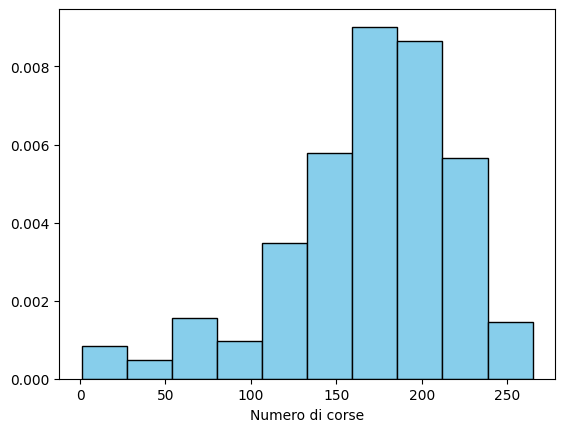

In [32]:
plt.hist(diz1['count'], color='skyblue', edgecolor='black', density=True)
plt.xlabel("Numero di corse")
plt.show()

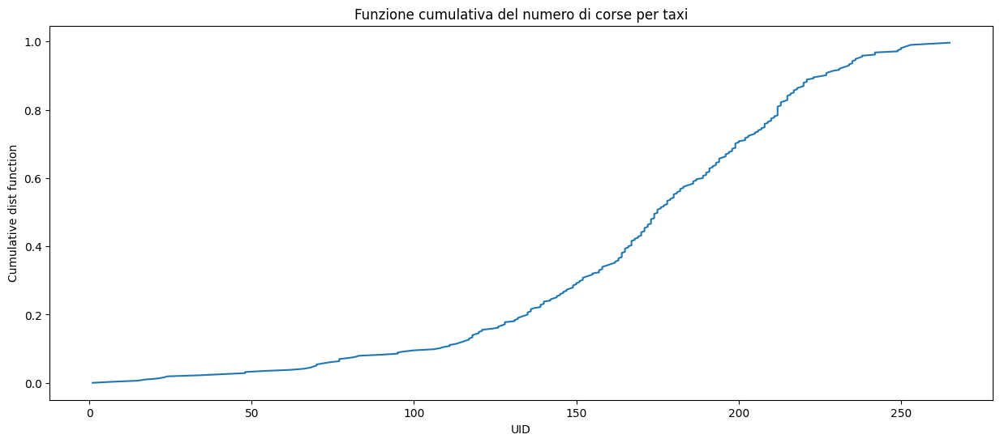

In [33]:
# Creare il bar plot
plt.figure(figsize=(15, 6))  # Imposta la dimensione della figura

plt.plot(diz1['count'], np.arange(len(diz1))/len(diz1))

# Aggiungere titoli e etichette
plt.title('Funzione cumulativa del numero di corse per taxi')
plt.xlabel('UID')
plt.ylabel('Cumulative dist function')

# Mostrare il grafico
plt.show()


***
***
***


<a id='termini_stops'></a>
### Estrazione serie temporale di stop a Termini

In [34]:
termini_tdf = scf_tdf[scf_tdf['tile_ID'] == termini_id]
ts_termini = termini_tdf.set_index('datetime')
termini_tdf.head()

,uid,datetime,lat,lng,tile_ID,leaving_datetime
103,2,2014-02-22 05:20:24.601842+01:00,41.903958,12.494706,1566,2014-02-22 05:58:27.871863+01:00
199,3,2014-02-08 18:08:43.751466+01:00,41.903362,12.496099,1566,2014-02-08 18:38:54.064749+01:00
202,3,2014-02-08 20:26:37.528077+01:00,41.903077,12.496087,1566,2014-02-08 20:41:47.748560+01:00
213,3,2014-02-10 09:03:26.461928+01:00,41.903085,12.496241,1566,2014-02-10 09:15:00.628629+01:00
231,3,2014-02-12 10:14:27.928502+01:00,41.903057,12.496272,1566,2014-02-12 10:24:43.062623+01:00


In [35]:
termini_tdf['tile_ID'].unique()

array([1566], dtype=object)

In [36]:
import numpy as np

In [48]:
# funzione per identificare i weekend nel mese d'interesse
weekends = ts_termini.index[np.array(ts_termini.index.dayofweek >= 5) * np.array(ts_termini.index.dayofweek <=6)]

In [49]:
# funzione per estrarre la serie temporale con granularità desiderata
def get_time_series(ext_mapped_tdf, tile_ID=None, po_name='ALL', time_unit='D'):
  if tile_ID is None:
    if po_name == 'ALL':
      selected_tdf = ext_mapped_tdf
    else:
      selected_tdf = ext_mapped_tdf[ext_mapped_tdf['po_name'] == po_name]
  else:  
    selected_tdf = ext_mapped_tdf[ext_mapped_tdf['tile_ID'] == tile_ID]
  ts_tile = selected_tdf.set_index('datetime').resample(time_unit).agg("count")
  ts_tile = pd.Series(ts_tile['uid'])
  return ts_tile

In [50]:
ts_termini_12 = get_time_series(scf_tdf, tile_ID=termini_id, time_unit='12H')
ts_termini_3 = get_time_series(scf_tdf, tile_ID=termini_id, time_unit='3H')
ts_termini_1 = get_time_series(scf_tdf, tile_ID=termini_id, time_unit='H')

In [51]:
# salviamo su file le serie estratte
ts_termini_1.to_csv('./sf_series_taxi_1.csv', sep=',')
ts_termini_3.to_csv('./sf_series_taxi_3.csv', sep=',')
ts_termini_12.to_csv('./sf_series_taxi_12.csv', sep=',')

Plottiamo al serie temporale con campionamento ogni 3 ore sobrapposta a delle zone rosse che indicano i weekend all'interno della settimana

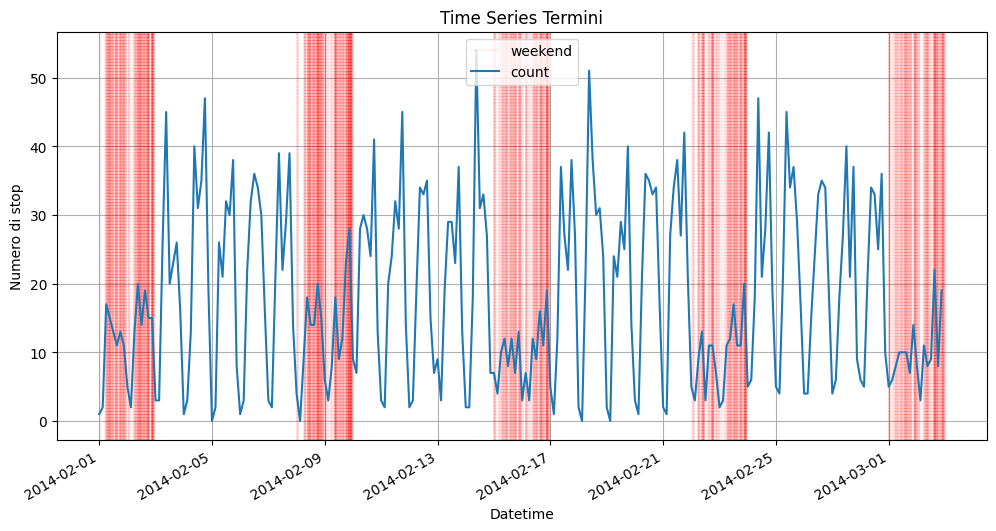

In [52]:
plt.figure(figsize=(12, 6))
# Aggiungere linee verticali per i weekend
chek = True
for weekend in weekends:
    if chek:
        plt.axvline(x=weekend, color='red', linestyle='--', linewidth=0.2, label = "weekend", alpha=0.6)
        chek=False
    else:
        plt.axvline(x=weekend, color='red', linestyle='--', linewidth=0.2, alpha=0.6)
ts_termini_3.plot(label="count")
plt.xlabel('Datetime')
plt.ylabel('Numero di stop')
plt.title('Time Series Termini')
plt.legend()
plt.grid(True)
plt.show()

In generale si nota come durante i weekend il numero di stops nella vicinanze di termini cali drasticamente. Indice del fatto che vi è un calo del numero di lavoratori che arrivano e partono da termini

***
***
***

<a id='time_series'></a>
# **TIME SERIES**

In [54]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm

In [55]:
# Leggi il CSV in un DataFrame di pandas ( concentrandoci solo su quella con campionamento ogni 3 ore)
ts_termini_3 = pd.read_csv('./sf_series_taxi_3.csv', parse_dates=['datetime'], index_col='datetime')['uid']
ts_termini_3.head()

datetime
2014-02-01 00:00:00+01:00     1
2014-02-01 03:00:00+01:00     2
2014-02-01 06:00:00+01:00    17
2014-02-01 09:00:00+01:00    15
2014-02-01 12:00:00+01:00    13
Name: uid, dtype: int64

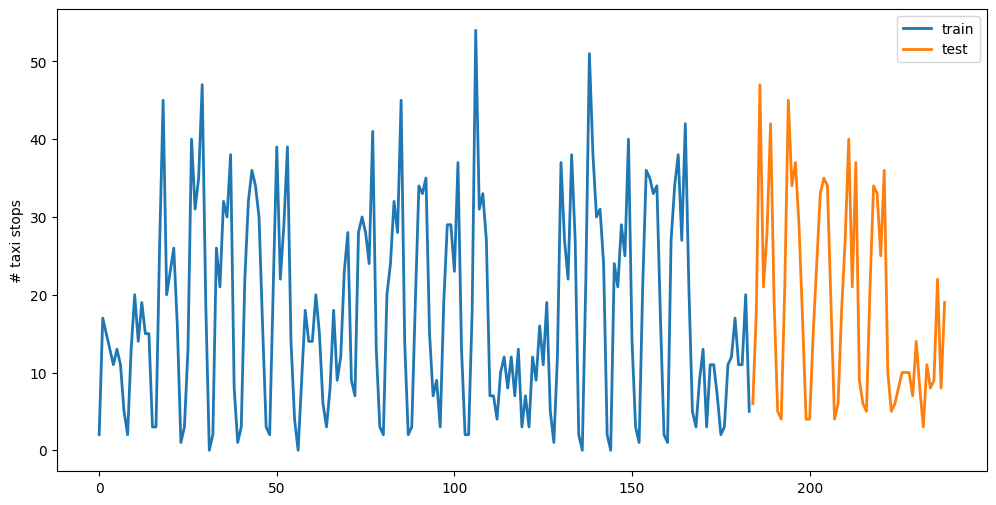

In [56]:
# splittimao test e train
split_index = 185
train, test = ts_termini_3.iloc[1:split_index], ts_termini_3.iloc[split_index:]
fig, ax = plt.subplots(figsize=(12,6))
plt.plot(range(len(train)), train, label='train', linewidth=2)
plt.plot(range(len(train), len(train)+len(test)), test, linewidth=2, label='test')
plt.ylabel('# taxi stops')
plt.legend()
plt.show()

In [57]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

applichiamo SARIMAX con una stagionalità di 56 (ovvero una stagionalità settimanale essendo che il nostro campionamento è ogni 3 ore)

/Users/andreaalessandrelli/anaconda3/envs/mobility1/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 3H will be used.
  self._init_dates(dates, freq)
/Users/andreaalessandrelli/anaconda3/envs/mobility1/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 3H will be used.
  self._init_dates(dates, freq)


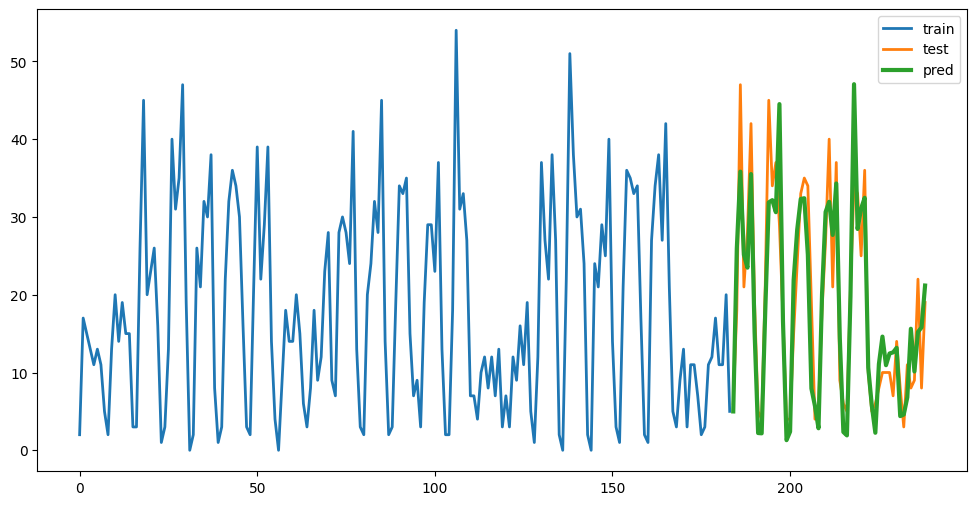

In [58]:
sarimax = SARIMAX(train, order=(1,0,0), seasonal_order=(1, 1, 1, 56)).fit(disp=False)
pred = sarimax.predict(start=test.index[0], end=test.index[-1])
fig, ax = plt.subplots(figsize=(12,6))
plt.plot(range(len(train)), train, label='train', linewidth=2)
plt.plot(range(len(train), len(train)+len(test)), test, label='test', linewidth=2)
plt.plot(range(len(train), len(train)+len(pred)), pred, label='pred', linewidth=3)
plt.legend()
plt.show()

In [59]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import median_absolute_error
def r2_score(y_true, y_pred, ts):
    mu = np.mean(ts)
    total = np.sum((y_true - mu) ** 2)
    residuals = np.sum((y_true - y_pred) ** 2)
    return 1 - (residuals / total)


def absolute_percentage_error(y_true, y_pred):
    return np.abs((y_true - y_pred) / y_pred)


def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(absolute_percentage_error(y_true, y_pred))


def max_absolute_percentage_error(y_true, y_pred):
    return np.max(absolute_percentage_error(y_true, y_pred))


def total_absolute_percentage_error(y_true, y_pred):
    return np.sum(absolute_percentage_error(y_true, y_pred))


def evaluate(y_true, y_pred, ts):
    return {
        'MAE': mean_absolute_error(y_true, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAD': median_absolute_error(y_true, y_pred),
        'R2': r2_score(y_true, y_pred, ts),
        'MAPE': mean_absolute_percentage_error(y_true, y_pred),
        'MAXAPE': max_absolute_percentage_error(y_true, y_pred),
        'TAPE': total_absolute_percentage_error(y_true, y_pred)
    }

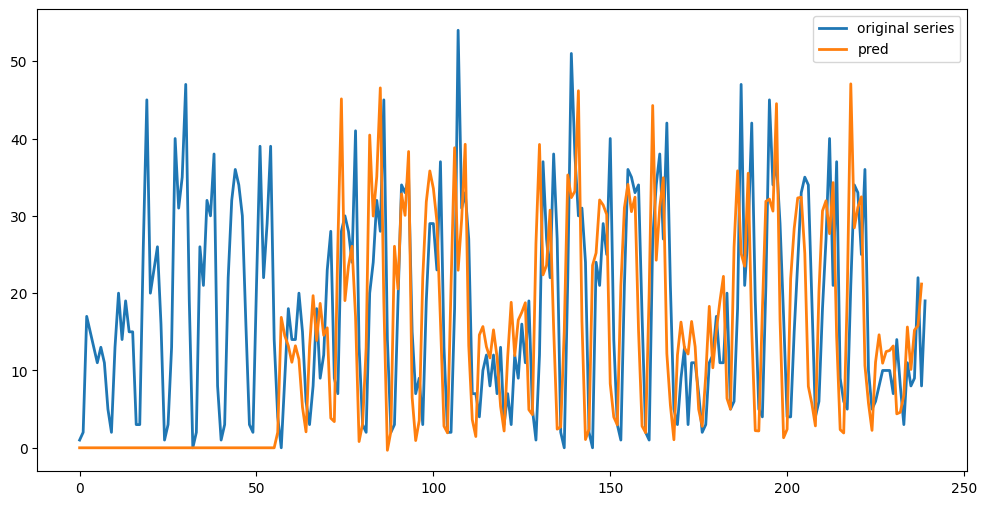

MAE 4.530
RMSE 5.683
MAD 3.641
R2 0.797
MAPE 0.422
MAXAPE 2.071
TAPE 23.214


In [60]:
pred_train = sarimax.predict(start=train.index[0], end=test.index[-1])
fig, ax = plt.subplots(figsize=(12,6))
plt.plot(range(len(ts_termini_3)), ts_termini_3, label='original series', linewidth=2)
plt.plot(range(len(train)+len(test)), pred_train, label='pred', linewidth=2)
plt.legend()
plt.show()

for k, v in evaluate(test, pred, ts_termini_3).items():
    print('%s %.3f' % (k, v))

Notiamo un buon accordo tre la serie predetta e quella reale